In [1]:
class color:
   PURPLE = '\033[95m'
   CYAN = '\033[96m'
   DARKCYAN = '\033[36m'
   BLUE = '\033[94m'
   GREEN = '\033[92m'
   YELLOW = '\033[93m'
   RED = '\033[91m'
   BOLD = '\033[1m'
   UNDERLINE = '\033[4m'
   END = '\033[0m'

 <img src="https://github.com/punyaslokaprusty/AudioClassification/blob/main/Audio%20sound%20with%20harmonic%20and%20Percursive%20sounds.png?raw=true">

# Sakha Global Intership Assignment By Punya Sloka Prusty
 Mentor- Bhimasen Varadacharya Purohit, Lead Data Scientist 
 

<img src='https://www.sakhaglobal.com/wp-content/uploads/2022/05/Sakha-a-Quantilus-Innovation-Company.png'>
<img src='https://github.com/punyaslokaprusty/Audio_Classification_by_Music_Genre_with_Flask_api/blob/main/punyaslokaprusty@ML%20Logo.png?raw=true'>


 **The Following Codes has a Mix of Borrowed codes different sources to understand How Sound and Music can be Classified
#### Please Follow the Project Sources.txt in The Folder For sources.

##### What is  a Music Genre.
A music genre is a conventional category that identifies some pieces of music as belonging to a shared tradition or set of conventions. It is to be distinguished from musical form and musical style, although in practice these terms are sometimes used interchangeably.
​
#### How Are we Going to Classify Sound
​
In sound processing, the mel-frequency cepstrum (MFC) is a representation of the short-term power spectrum of a sound, based on a linear cosine transform of a log power spectrum on a nonlinear mel scale of frequency.
​
Mel-frequency cepstral coefficients (MFCCs) are coefficients that collectively make up an MFC.They are derived from a type of cepstral representation of the audio clip (a nonlinear "spectrum-of-a-spectrum"). The difference between the cepstrum and the mel-frequency cepstrum is that in the MFC, the frequency bands are equally spaced on the mel scale, which approximates the human auditory system's response more closely than the linearly-spaced frequency bands used in the normal spectrum. This frequency warping can allow for better representation of sound, for example, in audio compression.
​
MFCCs are commonly derived as follows:
​
- Take the Fourier transform of (a windowed excerpt of) a signal.
- Map the powers of the spectrum obtained above onto the mel scale, using triangular overlapping windows or alternatively, cosine overlapping windows.
- Take the logs of the powers at each of the mel frequencies.
- Take the discrete cosine transform of the list of mel log powers, as if it were a signal.
- The MFCCs are the amplitudes of the resulting spectrum.



There can be variations on this process, for example: differences in the shape or spacing of the windows used to map the scale, or addition of dynamics features such as "delta" and "delta-delta" (first- and second-order frame-to-frame difference) coefficients.


Import All Libraries that we shall use for this dataset:


In [2]:
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import sklearn
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import SGDClassifier, LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier,GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from xgboost import XGBClassifier, XGBRFClassifier
from xgboost import plot_tree, plot_importance
from sklearn.metrics import confusion_matrix, accuracy_score, roc_auc_score, roc_curve
from sklearn.decomposition import PCA
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import RFE
from sklearn.metrics.pairwise import cosine_similarity

# import keras
# from tensorflow import keras
# from keras import Sequential
# from keras import layers
# import tensorflow as tf
# import tensorflow_addons as tfa
# from tensorflow.keras.preprocessing import image_dataset_from_directory
# from keras.utils.vis_utils import plot_model
# from tensorflow.keras import Sequential, Input
# from tensorflow.keras.utils import to_categorical
# from tensorflow.keras.layers import Dense, Dropout,SeparableConv2D, Activation, BatchNormalization, Flatten, GlobalAveragePooling2D, Conv2D, MaxPooling2D
# from tensorflow.keras.layers import Conv2D, Flatten
# from tensorflow.keras.callbacks import ReduceLROnPlateau,EarlyStopping, ModelCheckpoint
# from tensorflow.keras.applications.inception_v3 import InceptionV3
# from tensorflow.keras.preprocessing.image import ImageDataGenerator as IDG

import librosa
import librosa.display
import IPython.display as ipd

import eli5
from eli5.sklearn import PermutationImportance

import os
import warnings
warnings.filterwarnings('ignore')

# EDA of Audio Dataset:` GTZAN Dataset - Music Genre Classification` 
This Dataset was originally from http://marsyas.info/downloads/datasets.html but is not found. 
Luckily Data Scientist Andrada Olteanu had uploaded it to Kaggle Further use.
https://www.kaggle.com/datasets/andradaolteanu/gtzan-dataset-music-genre-classification

#### Content Of the Dataset:
`genres original` -  A collection of 10 genres with 100 audio files each, all having a length of 30 seconds (the famous GTZAN dataset, the MNIST of sounds)

`images original` - A visual representation for each audio file. One way to classify data is through neural networks. Because NNs (like CNN, what we will be using today) usually take in some sort of image representation, the audio files were converted to Mel Spectrograms to make this possible.

`2 CSV files` - Containing features of the audio files. One file has for each song (30 seconds long) a mean and variance computed over multiple features that can be extracted from an audio file. The other file has the same structure, but the songs were split before into 3 seconds audio files (this way increasing 10 times the amount of data we fuel into our classification models). With data, more is always better.


### The 10 Different Genres In this Dataset :

In [3]:
dir_ = '../input/gtzan-dataset-music-genre-classification/Data'
print(  list(os.listdir(f'{dir_}/genres_original/')) )

['disco', 'metal', 'reggae', 'blues', 'rock', 'classical', 'jazz', 'hiphop', 'country', 'pop']


We are going to Use `Librosa` package from https://librosa.org/ which is an audio and music processing package in Python.

### Understanding Audio

Let's first Explore our Audio Data to see how it looks (we'll work with blues.00024.wav file).

Sound: sequence of vibrations in varying pressure strengths (y)
The sample rate (sample_rate) is the number of samples of audio carried per second, measured in Hz or kHz

In [4]:
y, sample_rate = librosa.load(f'{dir_}/genres_original/blues/blues.00024.wav')
## Load an audio file as a floating point time series with Defualt Sample rate of 22050
print('y:', y, '\n')
print('y shape:', np.shape(y), '\n')

print(color.DARKCYAN+'Sample Rate (KHz):'+ color.END, sample_rate, '\n')
print(color.BOLD+'Check Len of Audio:'+ color.END, 661794/22050) 
# Length of the audio is given by sample no of data points divided by sample rate

y: [-0.0005188   0.00067139 -0.00146484 ... -0.02835083 -0.02896118
 -0.02661133] 

y shape: (661794,) 

Sample Rate (KHz): 22050 

Check Len of Audio: 30.013333333333332


In [5]:
audio, _ = librosa.effects.trim(y)

print('Audio File:', audio, '\n')
print('Audio File shape:', np.shape(audio))

Audio File: [-0.0005188   0.00067139 -0.00146484 ... -0.02835083 -0.02896118
 -0.02661133] 

Audio File shape: (661794,)


## 2D Representation of a Sound Wave in waveform

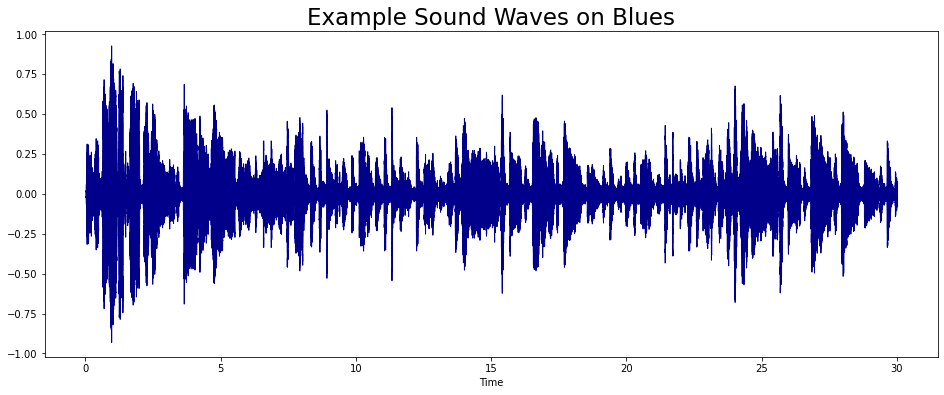

In [6]:
plt.figure(figsize = (16, 6))
librosa.display.waveshow(y = audio, sr = sample_rate, color = "#00008B");
plt.title("Example Sound Waves on Blues", fontsize = 23);

The waveform of sound shows us the amplitude , wavelength, etc:



- Higher the Frequency higher the pitch of a sound wave

- The Larger the amplitude the louder the sound

- Mathematical representation of sound wave:


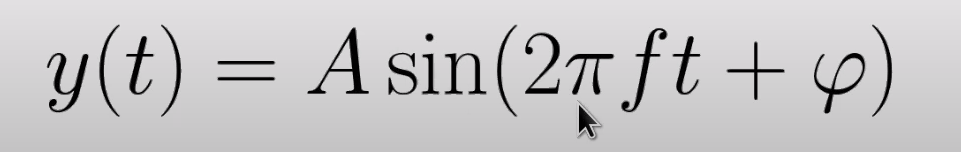

There is a sound recording Engineer named Bart Reardon whose explanation of sound waveforms with  is quite excellents in Quora please refer to that for more Insights :https://www.quora.com/What-can-one-understand-by-looking-at-a-waveform-diagram-of-an-audio-recording


Now lets move on to Fourier transform of the sound wave:
Fourier Transform decomposes complex periodic sound into sum of sime waves oscillateing at different frequencies 


In [7]:
#Fourier Transform

fft = 2048
hl = 512

stft = np.abs(librosa.stft(audio, n_fft = fft, hop_length = hl))

print(np.shape(stft))

(1025, 1293)


The Short-time Fourier transform (STFT), is a Fourier-related transform used to determine the sinusoidal frequency and phase content of local sections of a signal as it changes over time.

- computes several FFT at different intervals
- Preserves time information
- Fixed frame size
- Spectrogram (time + Frequency + Magnitude)

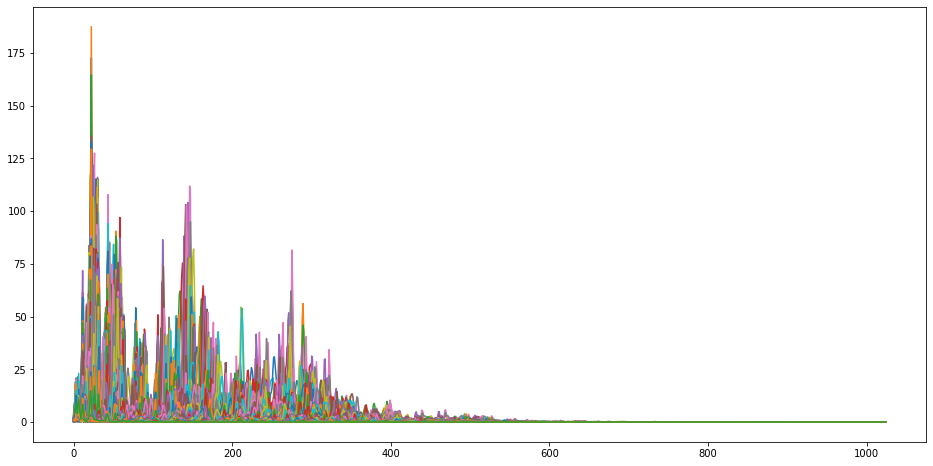

In [8]:
# Vizualize STFT
plt.figure(figsize = (16, 8))
plt.plot(stft);

### The Spectrogram¶
What is a spectrogram? 
- A spectrogram is a visual representation of the spectrum of frequencies of a signal as it varies with time. When applied to an audio signal, spectrograms are sometimes called sonographs, voiceprints, or voicegrams (wiki).


Here we convert the frequency axis to a logarithmic one.

Text(0, 0.5, 'Frequency in HZ')

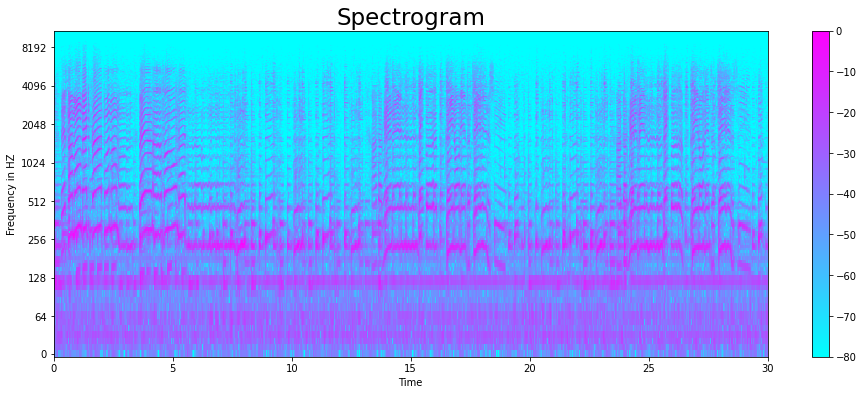

In [9]:
decibel = librosa.amplitude_to_db(stft, ref = np.max)

plt.figure(figsize = (16, 6))
librosa.display.specshow(decibel, sr = sample_rate, hop_length = hl, x_axis = 'time', y_axis = 'log',
                        cmap = 'cool')
plt.colorbar();
plt.title("Spectrogram", fontsize = 23)
plt.xlabel("Time")
plt.ylabel("Frequency in HZ")

#### As Discussed earlier we are going to Extract this MFCCs which is going to help us classify the audio data. So below are the visualizations of Mel spectrograms .

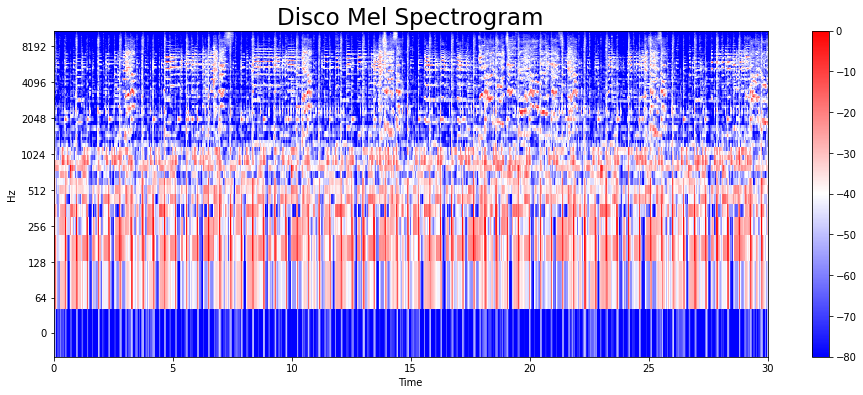

In [10]:
y, s = librosa.load(f'{dir_}/genres_original/disco/disco.00009.wav')
y, z = librosa.effects.trim(y)


mel = librosa.feature.melspectrogram(y, sr=s)
mel_db = librosa.amplitude_to_db(mel, ref=np.max)
plt.figure(figsize = (16, 6))
librosa.display.specshow(mel_db, sr=s, hop_length=hl, x_axis = 'time', y_axis = 'log',
                        cmap = 'bwr');
plt.colorbar();
plt.title("Disco Mel Spectrogram", fontsize = 23);

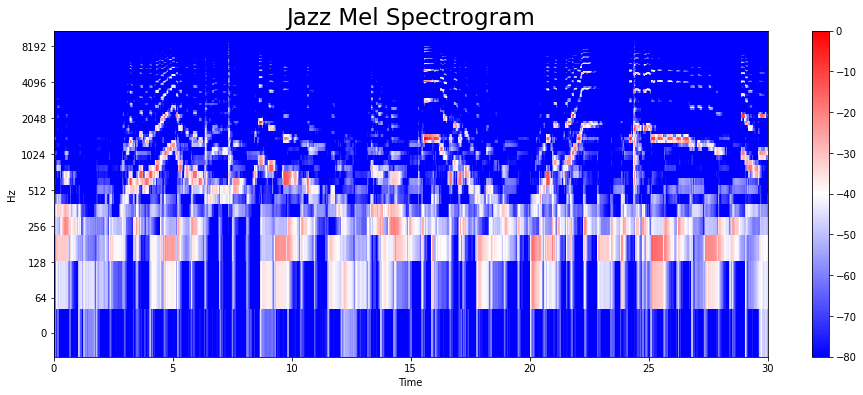

In [11]:
y, s = librosa.load(f'{dir_}/genres_original/jazz/jazz.00020.wav')
y, z = librosa.effects.trim(y)


mel = librosa.feature.melspectrogram(y, sr=s)
mel_db = librosa.amplitude_to_db(mel, ref=np.max)
plt.figure(figsize = (16, 6))
librosa.display.specshow(mel_db, sr=s, hop_length=hl, x_axis = 'time', y_axis = 'log',
                        cmap = 'bwr');
plt.colorbar();
plt.title("Jazz Mel Spectrogram", fontsize = 23);

In [12]:
zero_cross = librosa.zero_crossings(audio, pad=False)
print('The zero-crossing rate (ZCR) is ',sum(zero_cross) ,'. This is the rate at which a signal changes from positive to zero to negative or from negative to zero to positive.Its value has been widely used in both speech recognition and music information retrieval, being a key feature to classify percussive sounds.')


The zero-crossing rate (ZCR) is  31324 . This is the rate at which a signal changes from positive to zero to negative or from negative to zero to positive.Its value has been widely used in both speech recognition and music information retrieval, being a key feature to classify percussive sounds.


#### Now Lets check an audio time series into harmonic and percussive components.
What are Harmonic and Percussive Sounds? 
Musical sounds can comprise a wide range of sound components with different acoustic qualities. In particular, we consider two broad categories of sounds: harmonic sounds and percussive sounds. 


Loosely speaking, a harmonic sound is what we perceive as pitched sound, what makes us hear melodies and chords. The prototype of a harmonic sound is the acoustic realization of a sinusoid, which corresponds to a horizontal line in a spectrogram representation. The sound of a violin is another typical example of what we consider a harmonic sound. Again, most of the observed structures in the spectrogram are of horizontal nature (even though they are intermingled with noise-like components). 
Harmonics are characteristics that human ears can't distinguish.

On the other hand, a percussive sound is what we perceive as a clash, a knock, a clap, or a click. The sound of a drum stroke or a transient that occurs in the attack phase of a musical tone are further typical examples. The prototype of a percussive sound is the acoustic realization of an impulse, which corresponds to a vertical line in a spectrogram representation.
Perceptrual understanding shock wave represents the sound rhythm and emotion

Sound waves in Blue is Harmonic and Red is Percussive


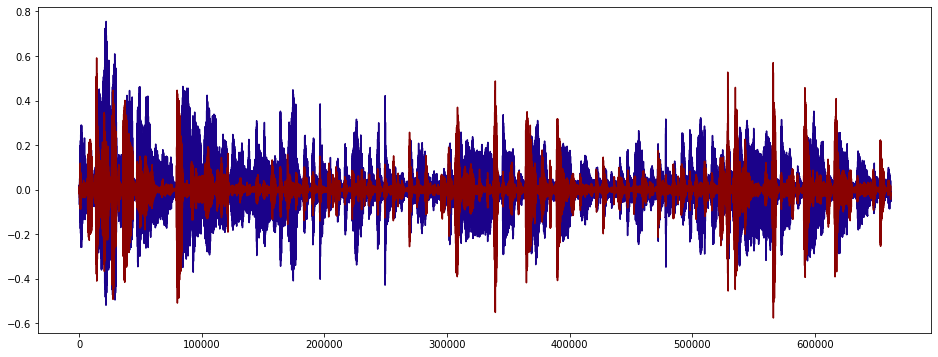

In [13]:
y_harm, y_perc = librosa.effects.hpss(audio)
print('Sound waves in Blue is Harmonic and Red is Percussive')
plt.figure(figsize = (16, 6))
plt.plot(y_harm, color = '#1b028a');
plt.plot(y_perc, color = '#8a0202');

In [14]:
sc = librosa.feature.spectral_centroid(audio, sr=s)[0]

print('Centroids:', sc, '\n')
print('Shape of Spectral Centroids:', sc.shape, '\n')
print('The spectral centroid is a measure used in digital signal processing to characterise a spectrum. It indicates where the center of mass of the spectrum is located. Perceptually, it has a robust connection with the impression of brightness of a sound. It is sometimes called center of spectral mass')
frames = range(len(sc))

t = librosa.frames_to_time(frames)#Converts frame counts to time (seconds).

print('frames:', frames, '\n')
print('t:', t)

def normalize(x, axis=0):
    return sklearn.preprocessing.minmax_scale(x, axis=axis)

Centroids: [941.61758152 724.34063991 735.10363598 ... 586.66037735 686.47347007
 807.02622397] 

Shape of Spectral Centroids: (1293,) 

The spectral centroid is a measure used in digital signal processing to characterise a spectrum. It indicates where the center of mass of the spectrum is located. Perceptually, it has a robust connection with the impression of brightness of a sound. It is sometimes called center of spectral mass
frames: range(0, 1293) 

t: [0.00000000e+00 2.32199546e-02 4.64399093e-02 ... 2.99537415e+01
 2.99769615e+01 3.00001814e+01]


### Spectral Centroids on Waveform

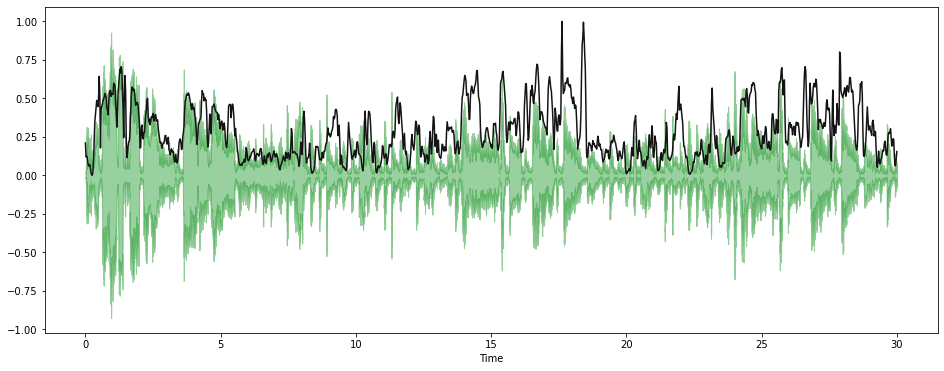

In [15]:
plt.figure(figsize = (16, 6))
librosa.display.waveshow(audio, sr=s, alpha=0.4, color = '#028A0F');
plt.plot(t, normalize(sc), color='#141414');

Spectral rolloff is the frequency below which a specified percentage of the total spectral energy, e.g. 85%, lies.


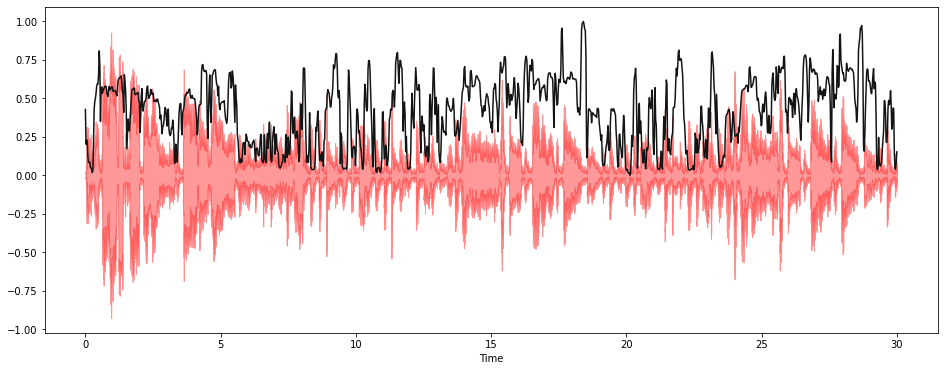

In [16]:
spectral_r = librosa.feature.spectral_rolloff(audio, sr=s)[0]
print('Spectral rolloff is the frequency below which a specified percentage of the total spectral energy, e.g. 85%, lies.')
# The plot
plt.figure(figsize = (16, 6))
librosa.display.waveshow(audio, sr=s, alpha=0.4, color = 'r');
plt.plot(t, normalize(spectral_r), color='#141414');

## MFCC

(20, 1293)


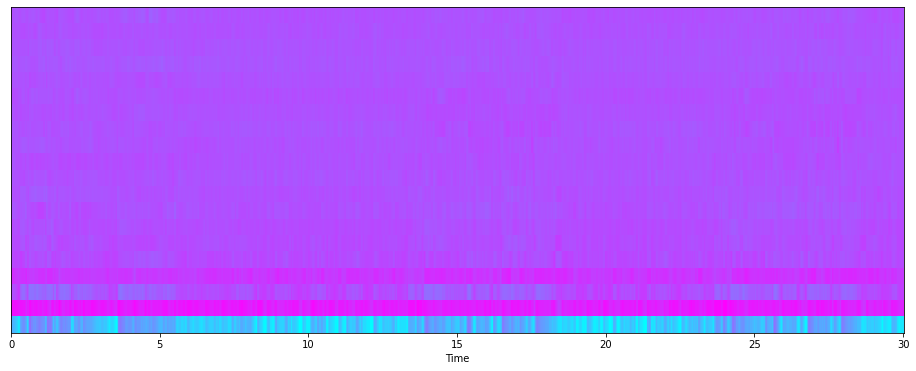

In [17]:
mfcc = librosa.feature.mfcc(audio, sr=s)
print(mfcc.shape)

plt.figure(figsize = (16, 6))
librosa.display.specshow(mfcc, sr=s, x_axis='time', cmap = 'cool');

## Scaled MFCCs

Mean: 5.9005373e-10 

Var: 1.0


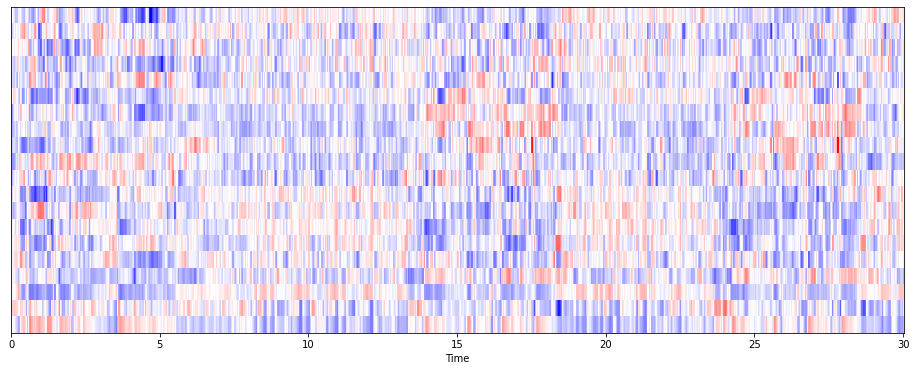

In [18]:
mfcc = sklearn.preprocessing.scale(mfcc, axis=1)
print('Mean:', mfcc.mean(), '\n')
print('Var:', mfcc.var())

plt.figure(figsize = (16, 6))
librosa.display.specshow(mfcc, sr=s, x_axis='time', cmap = 'bwr');

#### Chromagram is defined as the whole spectral audio information mapped into one octave. Each octave is divided into 12 bins representing each one semitone. The same strategy based on instantaneous frequency (IF), presented here, is adopted in this work to compute the features chroma.

Chromogram shape: (12, 133)


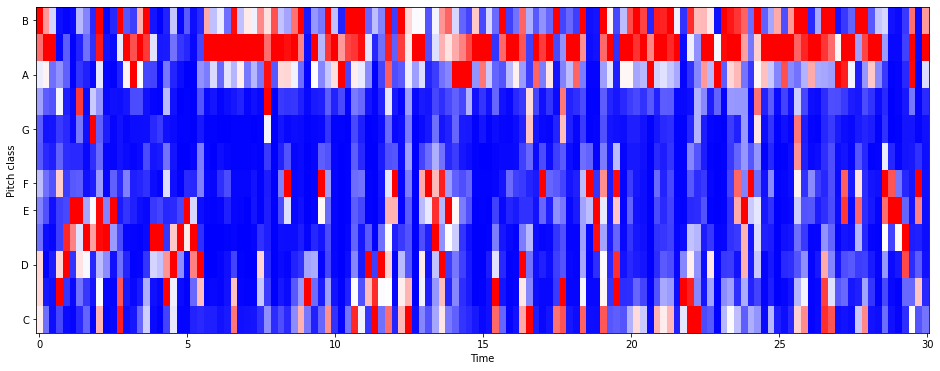

In [19]:
hl = 5000

#
chromagram = librosa.feature.chroma_stft(audio, sr=s, hop_length=hl)
print('Chromogram shape:', chromagram.shape)

plt.figure(figsize=(16, 6))
librosa.display.specshow(chromagram, x_axis='time', y_axis='chroma', hop_length=hl, cmap='bwr');

Traditional In audio Preprocessing we would extract features for waveform for time domain or do FFT and use spectrograms to extract Frequency domain Feature set .

But since here MFCCs :
- Capture timbral/textural aspects of sound
- Frequency domain feature
- Approximates human auditory system
- 13 to 40 coeffienct
- calculated at each Frame

### Feature Extraction

`Normally if this was just a directory of sound you would have to process audio data to obtain the some features and create a dataframe to implement ML on`, but in this dataset `we already have features extracted added to the two CSV Files` one with full 30 sec sampling and the other with further breakdown of those 30 sec samples to 3 sec to increase observation numbers(`this way increasing 10 times the amount of data we fuel into our classification models`)  

If you still want to know how Features are Extracted Jump to `Taking a song and predicting it Genre` where I have decomposed a song in a function to get exact feature set .

In [20]:
data_30sec = pd.read_csv(f'{dir_}/features_30_sec.csv')
data_30sec.head()

,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.00000.wav,661794,0.350088,0.088757,0.130228,0.002827,1784.165850,129774.064525,2002.449060,85882.761315,...,52.420910,-1.690215,36.524071,-0.408979,41.597103,-2.303523,55.062923,1.221291,46.936035,blues
1,blues.00001.wav,661794,0.340914,0.094980,0.095948,0.002373,1530.176679,375850.073649,2039.036516,213843.755497,...,55.356403,-0.731125,60.314529,0.295073,48.120598,-0.283518,51.106190,0.531217,45.786282,blues
2,blues.00002.wav,661794,0.363637,0.085275,0.175570,0.002746,1552.811865,156467.643368,1747.702312,76254.192257,...,40.598766,-7.729093,47.639427,-1.816407,52.382141,-3.439720,46.639660,-2.231258,30.573025,blues
3,blues.00003.wav,661794,0.404785,0.093999,0.141093,0.006346,1070.106615,184355.942417,1596.412872,166441.494769,...,44.427753,-3.319597,50.206673,0.636965,37.319130,-0.619121,37.259739,-3.407448,31.949339,blues
4,blues.00004.wav,661794,0.308526,0.087841,0.091529,0.002303,1835.004266,343399.939274,1748.172116,88445.209036,...,86.099236,-5.454034,75.269707,-0.916874,53.613918,-4.404827,62.910812,-11.703234,55.195160,blues


In [21]:
counter=0
for i in data_30sec.columns:
    if i!='label': #target Variable that list the Genre Labels
        counter+=1
    print(i)
print("The Total number of Features in this Set :",counter )

filename
length
chroma_stft_mean
chroma_stft_var
rms_mean
rms_var
spectral_centroid_mean
spectral_centroid_var
spectral_bandwidth_mean
spectral_bandwidth_var
rolloff_mean
rolloff_var
zero_crossing_rate_mean
zero_crossing_rate_var
harmony_mean
harmony_var
perceptr_mean
perceptr_var
tempo
mfcc1_mean
mfcc1_var
mfcc2_mean
mfcc2_var
mfcc3_mean
mfcc3_var
mfcc4_mean
mfcc4_var
mfcc5_mean
mfcc5_var
mfcc6_mean
mfcc6_var
mfcc7_mean
mfcc7_var
mfcc8_mean
mfcc8_var
mfcc9_mean
mfcc9_var
mfcc10_mean
mfcc10_var
mfcc11_mean
mfcc11_var
mfcc12_mean
mfcc12_var
mfcc13_mean
mfcc13_var
mfcc14_mean
mfcc14_var
mfcc15_mean
mfcc15_var
mfcc16_mean
mfcc16_var
mfcc17_mean
mfcc17_var
mfcc18_mean
mfcc18_var
mfcc19_mean
mfcc19_var
mfcc20_mean
mfcc20_var
label
The Total number of Features in this Set : 59


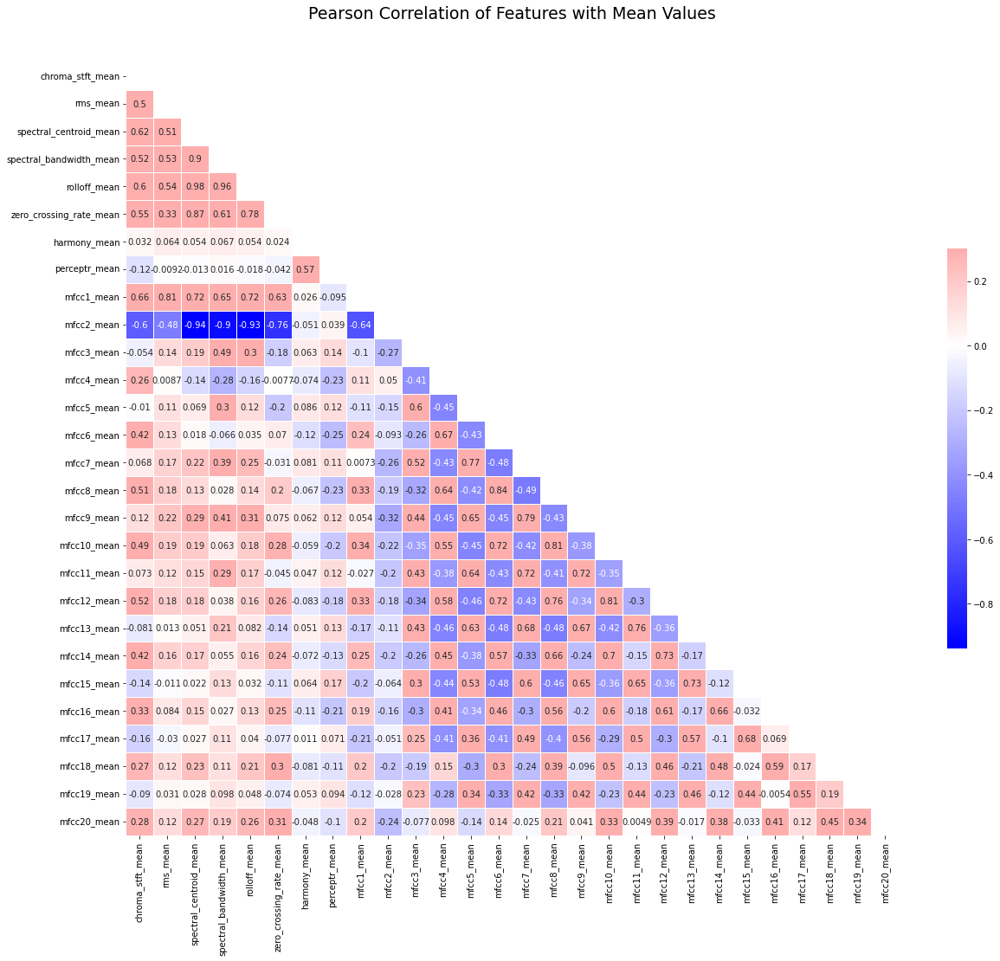

In [22]:
spike = [col for col in data_30sec.columns if 'mean' in col]
corr = data_30sec[spike].corr()

mask = np.triu(np.ones_like(corr, dtype=np.bool))

f, ax = plt.subplots(figsize=(20, 17));
plt.title('Pearson Correlation of Features with Mean Values', y=1.05, size=19)
sns.heatmap(corr, mask=mask, cmap="bwr", vmax=.3, center=0,
            square=True, linewidths=.7, cbar_kws={"shrink": .5},annot=True)

plt.xticks(fontsize = 10)
plt.yticks(fontsize = 10);

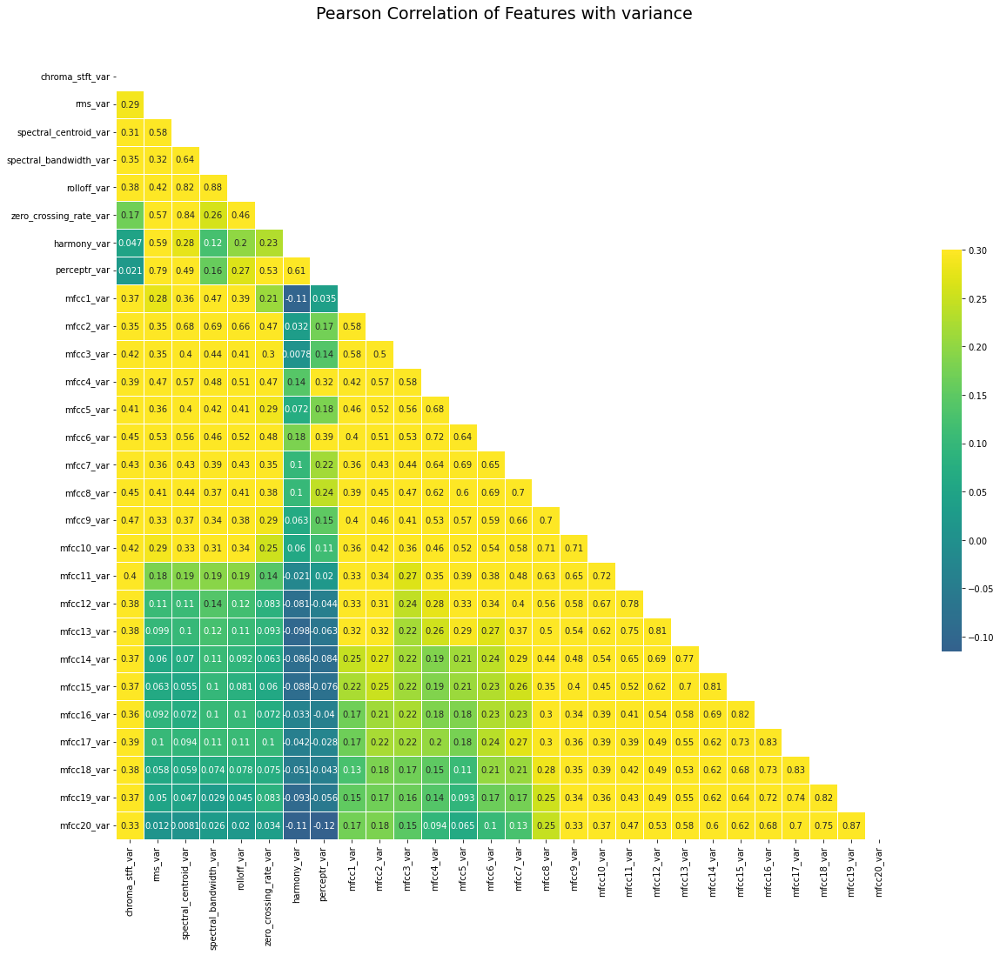

In [23]:
spike = [col for col in data_30sec.columns if 'var' in col]
corr = data_30sec[spike].corr()

mask = np.triu(np.ones_like(corr, dtype=np.bool))

f, ax = plt.subplots(figsize=(20, 17));
colormap = plt.cm.viridis
plt.title('Pearson Correlation of Features with variance', y=1.05, size=19)
sns.heatmap(corr, mask=mask, cmap=colormap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5},annot=True)

plt.xticks(fontsize = 10)
plt.yticks(fontsize = 10);

____________________________________________________________________________________________

Text(0, 0.5, 'Beats Per Minute-Tempo')

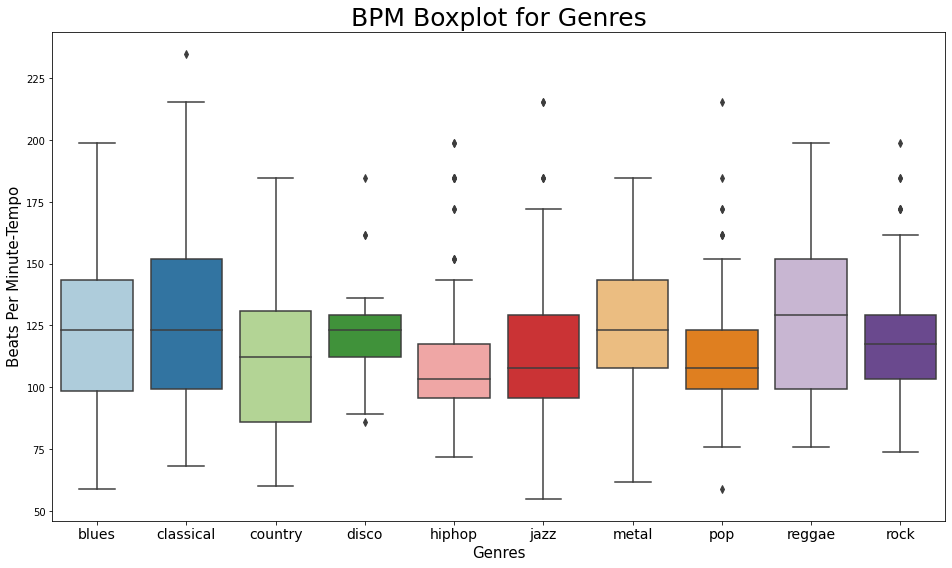

In [24]:
x = data_30sec[["label", "tempo"]]

f, ax = plt.subplots(figsize=(16, 9));
sns.boxplot(x = "label", y = "tempo", data = x, palette = 'Paired');

plt.title('BPM Boxplot for Genres', fontsize = 25)
plt.xticks(fontsize = 14)
plt.yticks(fontsize = 10);
plt.xlabel("Genres", fontsize = 15)
plt.ylabel("Beats Per Minute-Tempo", fontsize = 15)

## PCA with Min MAX scaling

What we are doing below here :

### Normalization with Min Max Scalling 
`Why do we use feature scaling?

Scaling the features makes the flow of gradient descent smooth and helps algorithms quickly reach the minima of the cost function. Without scaling features, the algorithm may be biased toward the feature which has values higher in magnitude.`
### PCA
PCA is a method that brings together:
- A measure of how each variable is associated with one another. (Covariance matrix.)
- The directions in which our data are dispersed. (Eigenvectors.)
- The relative importance of these different directions. (Eigenvalues.)

### The Scatter Plot
- to visualize possible groups of genres

In [25]:
data_30sec = data_30sec.iloc[0:, 1:]
y = data_30sec['label']
X = data_30sec.loc[:, data_30sec.columns != 'label']

cols = X.columns
scaler = preprocessing.MinMaxScaler()
np_scaled = scaler.fit_transform(X)
X = pd.DataFrame(np_scaled, columns = cols)

pca = PCA(n_components=2)
scaled_df = pca.fit_transform(X)
df_p = pd.DataFrame(data = scaled_df, columns = ['pca1', 'pca2'])

fdf = pd.concat([df_p, y], axis = 1)
pca.explained_variance_ratio_


array([0.2439355 , 0.21781804])

Text(0, 0.5, 'Principal Component 2')

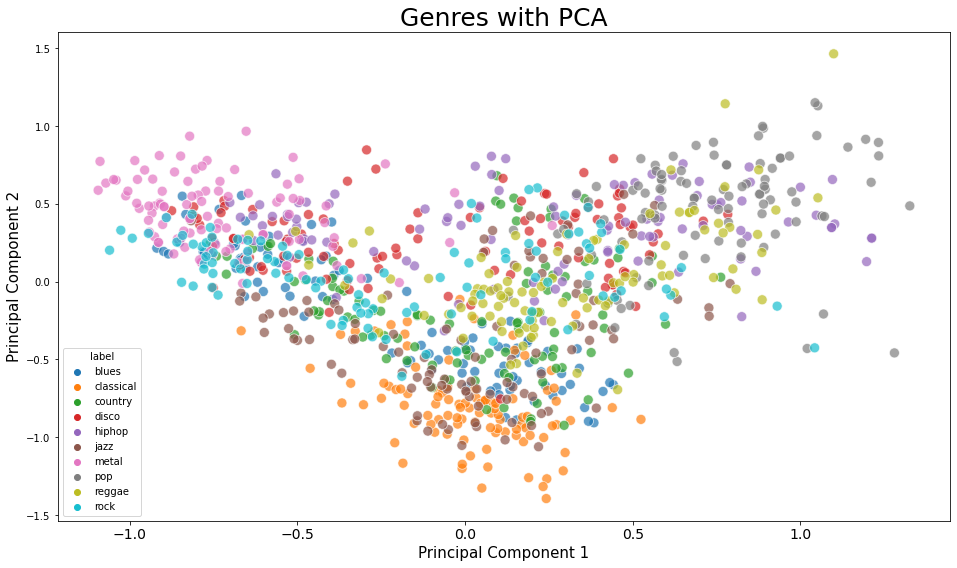

In [26]:
plt.figure(figsize = (16, 9))
sns.scatterplot(x = "pca1", y = "pca2", data = fdf, hue = "label", alpha = 0.7,
               s = 100);

plt.title('Genres with PCA', fontsize = 25)
plt.xticks(fontsize = 14)
plt.yticks(fontsize = 10);
plt.xlabel("Principal Component 1", fontsize = 15)
plt.ylabel("Principal Component 2", fontsize = 15)

# Model Building

This is beging on Data_3sec because we will have more data to prperly classify our data

In [27]:
df_3sec = pd.read_csv(f'{dir_}/features_3_sec.csv')
df_3sec = df_3sec.iloc[0:, 1:]
df_3sec.head()

,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,66149,0.335406,0.091048,0.130405,0.003521,1773.065032,167541.630869,1972.744388,117335.771563,3714.560359,...,39.687145,-3.241280,36.488243,0.722209,38.099152,-5.050335,33.618073,-0.243027,43.771767,blues
1,66149,0.343065,0.086147,0.112699,0.001450,1816.693777,90525.690866,2010.051501,65671.875673,3869.682242,...,64.748276,-6.055294,40.677654,0.159015,51.264091,-2.837699,97.030830,5.784063,59.943081,blues
2,66149,0.346815,0.092243,0.132003,0.004620,1788.539719,111407.437613,2084.565132,75124.921716,3997.639160,...,67.336563,-1.768610,28.348579,2.378768,45.717648,-1.938424,53.050835,2.517375,33.105122,blues
3,66149,0.363639,0.086856,0.132565,0.002448,1655.289045,111952.284517,1960.039988,82913.639269,3568.300218,...,47.739452,-3.841155,28.337118,1.218588,34.770935,-3.580352,50.836224,3.630866,32.023678,blues
4,66149,0.335579,0.088129,0.143289,0.001701,1630.656199,79667.267654,1948.503884,60204.020268,3469.992864,...,30.336359,0.664582,45.880913,1.689446,51.363583,-3.392489,26.738789,0.536961,29.146694,blues


In [28]:
df_3sec.shape

(9990, 59)

In [29]:
y = df_3sec['label']
X = df_3sec.loc[:, df_3sec.columns != 'label']
# Breaking Up  X and Y   Independent  and Target Variables )

# MinMAX Scaling implementation:
cols = X.columns
scaler = preprocessing.MinMaxScaler()
np_scaled = scaler.fit_transform(X)

X = pd.DataFrame(np_scaled, columns = cols)

## Train Test Spilt:

Breaking up datasets into training and testing 

In [30]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)


In [31]:
from sklearn.model_selection import GridSearchCV

## Gridsearch CV and ML Classifiers
Now down below is quite simple:
- Here we have defined a function called `Algo_search` where we are have assigned the function to both iterate and search through all the various ML Classfying Algorithms with multiple hyperparameters to output the best Model with respective best param.
- The ML algorithms Used are :
    - #### Regular Classifiers:
        * Logistic Regression
        * K Nearest Neighbour
        * Naive Bayes
        * Support Vector Machine
        * Decision Trees
    - #### Ensemble Methods:
        * Bagging:
            + Random Forest
        * Boosting:
            + Gradient Boosting
            + AdaBoost
    - #### Neural Nets :
        * Multilayer Perceptron (MLP Classifier)


In [32]:
# Warning This FUNCTION is Going to Eat through Your CPU and Take Hours TO RUN through . I would Suggest Switching to RandomisedSearchCV 
def Algo_search(models , params):
    max_score = 0
    max_model = None
    max_model_params = None

    for i,j in zip(models.keys() , models.values() ):
        gs = GridSearchCV(estimator=j,param_grid=params[i],n_jobs=-1,verbose=3)
        a = gs.fit(X_train,y_train)
        score = gs.score(X_test,y_test)
        
        if score > max_score:
            max_score = score
            max_model = gs.best_estimator_
            max_model_params = gs.best_params_

    return max_score, max_model, max_model_params

      #Data points
models = {'model_gbm':GradientBoostingClassifier(), 'model_rf':RandomForestClassifier(), 
          'model_dt':DecisionTreeClassifier(), 'model_svm':SVC(), 'model_ada':AdaBoostClassifier(),
         'model_nb':GaussianNB(),'model_sdg':SGDClassifier(),'model_KNN':KNeighborsClassifier(),
          'model_LG':LogisticRegression(),'model_NN':MLPClassifier()}
params_gbm = {'learning_rate':[0.1,0.2,0.3,0.4], 'n_estimators':[50,100,500,1000,2000]}
params_rf = {'n_estimators':[50,100,500,1000,2000],'max_depth':[5,7,10],'random_state':[0,2,5]}
params_dt = {'splitter':['best','random'], 'max_depth':[1, 5, 10, 50, 100]}
params_svm = {'decision_function_shape':["ovo"],'C':[1,2,5,10,50,100,500], 'kernel':['rbf','poly','sigmoid','linear']}
params_ada = {'n_estimators':[10,20,30,50,100,500,1000], 'learning_rate':[0.5,1,2,5,10]}
params_nb={}
params_sgd={'max_iter':[1000,5000], 'random_state':[0,5,20]}
params_KNN={'n_neighbors':[5,10,19,25]}
params_LG={ 'random_state':[0,5,20],'solver':['lbfgs'],'multi_class':['multinomial']}
params_NN={'solver':['lbfgs'], 'alpha':[1e-5], 'hidden_layer_sizes':[(5000, 10)], 'random_state':[1,5,20]}

params = {'model_gbm':params_gbm, 'model_rf':params_rf, 'model_dt':params_dt, 
          'model_svm':params_svm, 'model_ada':params_ada,'model_nb':params_nb,'model_sdg':params_sgd,
          'model_KNN':params_KNN,
          'model_LG':params_LG,'model_NN':params_NN}
grid_ml = Algo_search(models = models, params = params)


Fitting 5 folds for each of 20 candidates, totalling 100 fits
[CV 4/5] END learning_rate=0.1, n_estimators=50;, score=0.763 total time= 1.3min
[CV 5/5] END learning_rate=0.1, n_estimators=50;, score=0.771 total time= 1.3min
[CV 4/5] END learning_rate=0.1, n_estimators=100;, score=0.799 total time= 2.6min
[CV 3/5] END learning_rate=0.1, n_estimators=500;, score=0.868 total time=13.0min
[CV 2/5] END learning_rate=0.1, n_estimators=1000;, score=0.863 total time=26.0min
[CV 1/5] END learning_rate=0.1, n_estimators=2000;, score=0.876 total time=51.8min
[CV 5/5] END learning_rate=0.1, n_estimators=2000;, score=0.876 total time=52.0min
[CV 4/5] END learning_rate=0.2, n_estimators=1000;, score=0.870 total time=26.1min
[CV 3/5] END learning_rate=0.2, n_estimators=2000;, score=0.873 total time=36.2min
[CV 2/5] END learning_rate=0.3, n_estimators=100;, score=0.841 total time= 2.6min
[CV 4/5] END learning_rate=0.3, n_estimators=100;, score=0.835 total time= 2.6min
[CV 1/5] END learning_rate=0.3, n

/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,
/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV 2/5] END C=10, decision_function_shape=ovo, kernel=sigmoid;, score=0.099 total time=   7.7s
[CV 1/5] END C=10, decision_function_shape=ovo, kernel=linear;, score=0.741 total time=   2.3s
[CV 4/5] END C=10, decision_function_shape=ovo, kernel=linear;, score=0.745 total time=   2.4s
[CV 2/5] END C=50, decision_function_shape=ovo, kernel=rbf;, score=0.858 total time=   3.1s
[CV 1/5] END C=50, decision_function_shape=ovo, kernel=poly;, score=0.868 total time=   4.0s
[CV 5/5] END C=50, decision_function_shape=ovo, kernel=poly;, score=0.858 total time=   4.2s
[CV 4/5] END C=50, decision_function_shape=ovo, kernel=sigmoid;, score=0.088 total time=   6.9s
[CV 3/5] END C=50, decision_function_shape=ovo, kernel=linear;, score=0.741 total time=   3.1s
[CV 1/5] END C=100, decision_function_shape=ovo, kernel=rbf;, score=0.871 total time=   3.4s
[CV 1/5] END C=100, decision_function_shape=ovo, kernel=poly;, score=0.866 total time=   4.9s
[CV 5/5] END C=100, decision_function_shape=ovo, kernel=p

/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,
/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV 5/5] END learning_rate=0.5, n_estimators=100;, score=0.536 total time=   9.4s
[CV 4/5] END learning_rate=0.5, n_estimators=500;, score=0.489 total time=  45.0s
[CV 3/5] END learning_rate=0.5, n_estimators=1000;, score=0.360 total time= 1.5min
[CV 2/5] END ..learning_rate=1, n_estimators=20;, score=0.413 total time=   1.8s
[CV 4/5] END ..learning_rate=1, n_estimators=20;, score=0.429 total time=   1.8s
[CV 1/5] END ..learning_rate=1, n_estimators=30;, score=0.435 total time=   2.7s
[CV 3/5] END ..learning_rate=1, n_estimators=30;, score=0.440 total time=   2.6s
[CV 5/5] END ..learning_rate=1, n_estimators=30;, score=0.433 total time=   2.6s
[CV 2/5] END ..learning_rate=1, n_estimators=50;, score=0.474 total time=   4.4s
[CV 4/5] END ..learning_rate=1, n_estimators=50;, score=0.468 total time=   4.4s
[CV 1/5] END .learning_rate=1, n_estimators=100;, score=0.472 total time=   9.5s
[CV 3/5] END .learning_rate=1, n_estimators=100;, score=0.402 total time=   9.0s
[CV 1/5] END .learning_

/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,
/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


In [33]:
print(color.BOLD + 'The best model score and its best parameters are ' + color.END,grid_ml)

The best model score and its best parameters are  (0.9029029029029029, GradientBoostingClassifier(learning_rate=0.3, n_estimators=1000), {'learning_rate': 0.3, 'n_estimators': 1000})



[CV 3/5] END C=2, decision_function_shape=ovo, kernel=rbf;, score=0.753 total time=   3.4s
[CV 1/5] END C=2, decision_function_shape=ovo, kernel=poly;, score=0.791 total time=   2.4s
[CV 5/5] END C=2, decision_function_shape=ovo, kernel=poly;, score=0.811 total time=   2.4s
[CV 3/5] END C=2, decision_function_shape=ovo, kernel=sigmoid;, score=0.149 total time=  10.1s
[CV 3/5] END C=2, decision_function_shape=ovo, kernel=linear;, score=0.715 total time=   2.5s
[CV 1/5] END C=5, decision_function_shape=ovo, kernel=rbf;, score=0.788 total time=   3.4s
[CV 4/5] END C=5, decision_function_shape=ovo, kernel=rbf;, score=0.815 total time=   3.5s
[CV 3/5] END C=5, decision_function_shape=ovo, kernel=poly;, score=0.818 total time=   2.6s
[CV 2/5] END C=5, decision_function_shape=ovo, kernel=sigmoid;, score=0.119 total time=   8.2s
[CV 1/5] END C=5, decision_function_shape=ovo, kernel=linear;, score=0.731 total time=   2.3s
[CV 4/5] END C=5, decision_function_shape=ovo, kernel=linear;, score=0.7

/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,
/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


Accuracy : 0.90157 



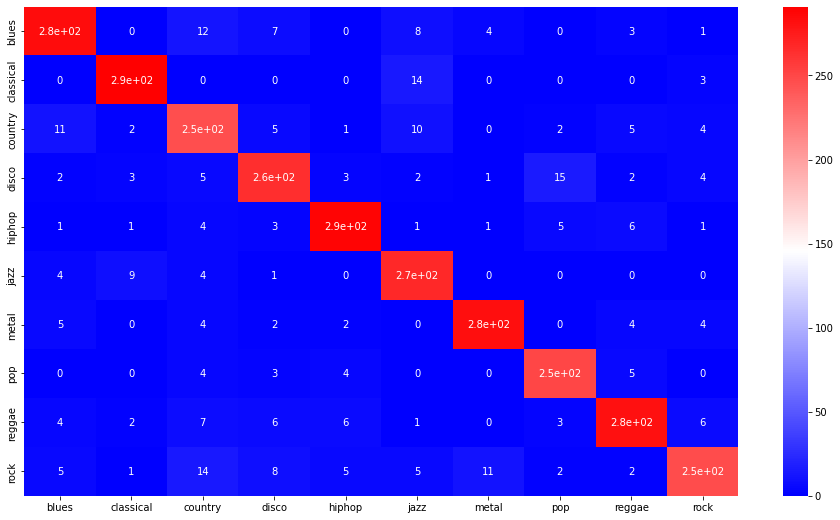

In [34]:
GBC = GradientBoostingClassifier(learning_rate=0.3, n_estimators=2000)
GBC.fit(X_train, y_train)


preds = GBC.predict(X_test)

print('Accuracy', ':', round(accuracy_score(y_test, preds), 5), '\n')

conf = confusion_matrix(y_test, preds)

plt.figure(figsize = (16, 9))
sns.heatmap(conf, cmap="bwr", annot=True, 
            xticklabels = ["blues", "classical", "country", "disco", "hiphop", "jazz", "metal", "pop", "reggae", "rock"],
           yticklabels=["blues", "classical", "country", "disco", "hiphop", "jazz", "metal", "pop", "reggae", "rock"]);



##### The Above Figure is Multi Class Confusion Matrix 




# Taking a song and predicting it Genre

Below we writing a Function to take a song and Predict its Genre using the Algo that we Used to predict.
In this Function:
- We start Decomposing the song to an Array using Librosa Lib
- Then we are trimming the song of Useless Noise 
- Then we are extracting the same features of the song that we used to train the classification model 
- Then the same feature set are the added and arranged in the same format as Training set was made.
- Finally we use ml.predict to predict the genre of song
- The Function in end prints the Prediction


In [35]:
# Predict Genre Funtion

def predict_Genre(song):
    y, s = librosa.load(song)
    trim_y, _ = librosa.effects.trim(y)
    '''It will trim leading and trailing silence from an audio signal. 
    In this code, we will remove audio signal that is lower than 10db'''
    chroma_stft = librosa.feature.chroma_stft(y=trim_y, sr=s,n_fft=2048, hop_length=512).flatten()
    rmse = librosa.feature.rms(y=trim_y, frame_length=2048, hop_length=512).flatten()  
    spec_cent = librosa.feature.spectral_centroid(y=trim_y, sr=s, n_fft=2048,hop_length=512).flatten()
    spec_bw = librosa.feature.spectral_bandwidth(y=trim_y, sr=s,n_fft=2048, hop_length=512).flatten()
    rolloff = librosa.feature.spectral_rolloff(y=trim_y + 0.01, sr=s,n_fft=2048, hop_length=512).flatten()
    zcr = librosa.feature.zero_crossing_rate(trim_y,frame_length=2048, hop_length=512).flatten()
    y_harmonic, y_percep = librosa.effects.hpss(trim_y)
    tempo,beats = librosa.beat.beat_track(y, sr = s)
    mfcc = librosa.feature.mfcc(y=trim_y, sr=s,win_length=2048, hop_length=512)
    mfcc_mean=mfcc.T.mean(axis=0)
    mfcc_var=mfcc.T.var(axis=0)

    length=y.shape[0]
    chroma_stft_mean=chroma_stft.mean()
    chroma_stft_var=chroma_stft.var()
    rms_mean=rmse.mean()
    rms_var=rmse.var()
    spectral_centroid_mean=spec_cent.mean()
    spectral_centroid_var=spec_cent.var()
    spectral_bandwidth_mean=spec_bw.mean()
    spectral_bandwidth_var=spec_bw.var()
    rolloff_mean=rolloff.mean()
    rolloff_var=rolloff.var()
    zero_crossing_rate_mean=zcr.mean()
    zero_crossing_rate_var=zcr.var()
    harmony_mean=y_harmonic.mean()
    harmony_var=y_harmonic.var()
    perceptr_mean=y_percep.mean()
    perceptr_var=y_percep.var()
    mfcc1_mean=mfcc_mean[0]
    mfcc1_var=mfcc_var[0]
    mfcc2_mean=mfcc_mean[1]
    mfcc2_var=mfcc_var[1]
    mfcc3_mean=mfcc_mean[2]
    mfcc3_var=mfcc_var[2]
    mfcc4_mean=mfcc_mean[3]
    mfcc4_var=mfcc_var[3]
    mfcc5_mean=mfcc_mean[4]
    mfcc5_var=mfcc_var[4]
    mfcc6_mean=mfcc_mean[5]
    mfcc6_var=mfcc_var[5]
    mfcc7_mean=mfcc_mean[6]
    mfcc7_var=mfcc_var[6]
    mfcc8_mean=mfcc_mean[7]
    mfcc8_var=mfcc_var[7]
    mfcc9_mean=mfcc_mean[8]
    mfcc9_var=mfcc_var[8]
    mfcc10_mean=mfcc_mean[9]
    mfcc10_var=mfcc_var[9]
    mfcc11_mean=mfcc_mean[10]
    mfcc11_var=mfcc_var[10]
    mfcc12_mean=mfcc_mean[11]
    mfcc12_var=mfcc_var[11]
    mfcc13_mean=mfcc_mean[12]
    mfcc13_var=mfcc_var[12]
    mfcc14_mean=mfcc_mean[13]
    mfcc14_var=mfcc_var[13]
    mfcc15_mean=mfcc_mean[14]
    mfcc15_var=mfcc_var[14]
    mfcc16_mean=mfcc_mean[15]
    mfcc16_var=mfcc_var[15]
    mfcc17_mean=mfcc_mean[16]
    mfcc17_var=mfcc_var[16]
    mfcc18_mean=mfcc_mean[17]
    mfcc18_var=mfcc_var[17]
    mfcc19_mean=mfcc_mean[18]
    mfcc19_var=mfcc_var[18]
    mfcc20_mean=mfcc_mean[19]
    mfcc20_var=mfcc_var[19]
    feature_array=np.array([length, chroma_stft_mean, chroma_stft_var, rms_mean, rms_var,
           spectral_centroid_mean, spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var, 
               rolloff_mean,rolloff_var,zero_crossing_rate_mean, zero_crossing_rate_var,
           harmony_mean,harmony_var,perceptr_mean,perceptr_var,tempo,
           mfcc1_mean, mfcc1_var, mfcc2_mean,mfcc2_var,mfcc3_mean,
           mfcc3_var,mfcc4_mean, mfcc4_var, mfcc5_mean, mfcc5_var,
           mfcc6_mean,mfcc6_var,mfcc7_mean,mfcc7_var,mfcc8_mean,
           mfcc8_var, mfcc9_mean, mfcc9_var,mfcc10_mean,mfcc10_var,
           mfcc11_mean,mfcc11_var, mfcc12_mean,mfcc12_var,mfcc13_mean,
           mfcc13_var, mfcc14_mean, mfcc14_var, mfcc15_mean, mfcc15_var,
           mfcc16_mean, mfcc16_var, mfcc17_mean, mfcc17_var, mfcc18_mean,
           mfcc18_var,mfcc19_mean, mfcc19_var, mfcc20_mean, mfcc20_var])
    song_test=feature_array.reshape(1,-1)
    Song = pd.DataFrame(song_test, columns = ['length', 'chroma_stft_mean', 'chroma_stft_var', 'rms_mean', 'rms_var',
       'spectral_centroid_mean', 'spectral_centroid_var',
       'spectral_bandwidth_mean', 'spectral_bandwidth_var', 'rolloff_mean',
       'rolloff_var', 'zero_crossing_rate_mean', 'zero_crossing_rate_var',
       'harmony_mean', 'harmony_var', 'perceptr_mean', 'perceptr_var', 'tempo',
       'mfcc1_mean', 'mfcc1_var', 'mfcc2_mean', 'mfcc2_var', 'mfcc3_mean',
       'mfcc3_var', 'mfcc4_mean', 'mfcc4_var', 'mfcc5_mean', 'mfcc5_var',
       'mfcc6_mean', 'mfcc6_var', 'mfcc7_mean', 'mfcc7_var', 'mfcc8_mean',
       'mfcc8_var', 'mfcc9_mean', 'mfcc9_var', 'mfcc10_mean', 'mfcc10_var',
       'mfcc11_mean', 'mfcc11_var', 'mfcc12_mean', 'mfcc12_var', 'mfcc13_mean',
       'mfcc13_var', 'mfcc14_mean', 'mfcc14_var', 'mfcc15_mean', 'mfcc15_var',
       'mfcc16_mean', 'mfcc16_var', 'mfcc17_mean', 'mfcc17_var', 'mfcc18_mean',
       'mfcc18_var', 'mfcc19_mean', 'mfcc19_var', 'mfcc20_mean', 'mfcc20_var'])
    pred=GBC.predict(Song)
    print('This song belongs to ' ,color.BOLD+ pred[0] +color.END,'Genre Or it may have more similarity to such genre as per Our ML model. \n Although kindly note that because our ML model has a 90% score accuracy and that may have misclassified. \n But then again as we have previous know that music `genre is to be distinguished from musical form and musical style, although in practice these terms are sometimes used interchangeably`.​')
    return ipd.Audio(song)
    

In [36]:
song=f'{dir_}/genres_original/blues/blues.00012.wav'
predict_Genre(song)

This song belongs to  blues Genre Or it may have more similarity to such genre as per Our ML model. 
 Although kindly note that because our ML model has a 90% score accuracy and that may have misclassified. 
 But then again as we have previous know that music `genre is to be distinguished from musical form and musical style, although in practice these terms are sometimes used interchangeably`.​


In [37]:
rock=f'{dir_}/genres_original/rock/rock.00031.wav'
predict_Genre(rock)

This song belongs to  pop Genre Or it may have more similarity to such genre as per Our ML model. 
 Although kindly note that because our ML model has a 90% score accuracy and that may have misclassified. 
 But then again as we have previous know that music `genre is to be distinguished from musical form and musical style, although in practice these terms are sometimes used interchangeably`.​


In [38]:
rock=f'{dir_}/genres_original/rock/rock.00035.wav'
x=predict_Genre(rock)

This song belongs to  hiphop Genre Or it may have more similarity to such genre as per Our ML model. 
 Although kindly note that because our ML model has a 90% score accuracy and that may have misclassified. 
 But then again as we have previous know that music `genre is to be distinguished from musical form and musical style, although in practice these terms are sometimes used interchangeably`.​


- The last one is Misclassification to Hiphop as our ML model has just a 90 % accuracy so 10% on the time it will misclassify.
- We can take another way that the given sound might have more similarity acsoutically towards Hiphop than rock as we know that these genres have some overlaps 

### Feature Importance Check
Permutation feature importance is a model inspection technique that can be used for any fitted estimator when the data is tabular. This is especially useful for non-linear or opaque estimators. The permutation feature importance is defined to be the decrease in a model score when a single feature value is randomly shuffled 1. This procedure breaks the relationship between the feature and the target, thus the drop in the model score is indicative of how much the model depends on the feature. This technique benefits from being model agnostic and can be calculated many times with different permutations of the feature.

In [39]:
perm = PermutationImportance(estimator=GBC, random_state=1)
perm.fit(X_test, y_test)

eli5.show_weights(estimator=perm, feature_names = X_test.columns.tolist())

Weight,Feature
0.0831 ± 0.0094,perceptr_var
0.0576 ± 0.0059,perceptr_mean
0.0368 ± 0.0017,harmony_mean
0.0340 ± 0.0026,mfcc4_mean
0.0294 ± 0.0079,chroma_stft_mean
0.0286 ± 0.0057,rms_var
0.0266 ± 0.0053,mfcc9_mean
0.0237 ± 0.0054,harmony_var
0.0230 ± 0.0036,mfcc3_mean
0.0197 ± 0.0043,mfcc6_mean


### Cosine similarity
Calculates the pairwise cosine similarity for each combination of songs in the data. This results in a 1000 x 1000 matrix (with redundancy in the information as item A similarity to item B == item B similarity to item A).

## Lets Find  Song Recommended as per a selected song type:

In [40]:
y_test.value_counts()

blues        319
reggae       316
hiphop       311
classical    308
metal        303
disco        301
rock         300
jazz         286
country      286
pop          267
Name: label, dtype: int64

In [41]:
df = pd.read_csv(f'{dir_}/features_30_sec.csv', index_col='filename')

labels = df[['label']]

df = df.drop(columns=['length','label'])
df

scaled=preprocessing.scale(df)
print('Scaled data type:', type(scaled))

Scaled data type: <class 'numpy.ndarray'>


In [42]:
similarity = cosine_similarity(scaled)
print("Similarity shape:", similarity.shape)

sim_df_labels = pd.DataFrame(similarity)
sim_df_names = sim_df_labels.set_index(labels.index)
sim_df_names.columns = labels.index

sim_df_names

Similarity shape: (1000, 1000)


filename,blues.00000.wav,blues.00001.wav,blues.00002.wav,blues.00003.wav,blues.00004.wav,blues.00005.wav,blues.00006.wav,blues.00007.wav,blues.00008.wav,blues.00009.wav,...,rock.00090.wav,rock.00091.wav,rock.00092.wav,rock.00093.wav,rock.00094.wav,rock.00095.wav,rock.00096.wav,rock.00097.wav,rock.00098.wav,rock.00099.wav
filename,,,,,,,,,,,,,,,,,,,,,
blues.00000.wav,1.000000,0.049231,0.589618,0.284862,0.025561,-0.346688,-0.219483,-0.167626,0.641877,-0.097889,...,-0.082829,0.546169,0.578558,0.662590,0.571629,0.610942,0.640835,0.496294,0.284958,0.304098
blues.00001.wav,0.049231,1.000000,-0.096834,0.520903,0.080749,0.307856,0.318286,0.415258,0.120649,0.404168,...,-0.098111,-0.325126,-0.370792,-0.191698,-0.330834,-0.077301,-0.222119,-0.302573,0.499562,0.311723
blues.00002.wav,0.589618,-0.096834,1.000000,0.210411,0.400266,-0.082019,-0.028061,0.104446,0.468113,-0.132532,...,-0.032408,0.561074,0.590779,0.583293,0.514537,0.495707,0.566837,0.589983,0.216378,0.321069
blues.00003.wav,0.284862,0.520903,0.210411,1.000000,0.126437,0.134796,0.300746,0.324566,0.352758,0.295184,...,-0.320107,-0.206516,-0.151132,0.041986,-0.172515,-0.000287,0.020515,-0.107821,0.502279,0.183210
blues.00004.wav,0.025561,0.080749,0.400266,0.126437,1.000000,0.556066,0.482195,0.623455,0.029703,0.471657,...,0.087605,0.017366,0.138035,0.104684,-0.034594,0.063454,0.063546,0.172944,0.153192,0.061785
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
rock.00095.wav,0.610942,-0.077301,0.495707,-0.000287,0.063454,-0.231012,-0.251086,-0.180628,0.619450,-0.258421,...,0.023926,0.843727,0.851726,0.860594,0.851456,1.000000,0.902064,0.865241,0.349870,0.522483
rock.00096.wav,0.640835,-0.222119,0.566837,0.020515,0.063546,-0.272209,-0.291506,-0.256171,0.612170,-0.304636,...,-0.033826,0.871226,0.882825,0.880362,0.863062,0.902064,1.000000,0.902071,0.337834,0.472331
rock.00097.wav,0.496294,-0.302573,0.589983,-0.107821,0.172944,-0.175960,-0.203014,-0.155732,0.461320,-0.330066,...,-0.008336,0.914170,0.926558,0.897654,0.878851,0.865241,0.902071,1.000000,0.287157,0.415173


In [43]:
def find_similar_songs(name):
    series = sim_df_names[name].sort_values(ascending = False)
    series = series.drop(name)
    print("\n**************************************************\n Top 5 Recommended songs if you like:-", name)
    print(series.head(5))
        
    
find_similar_songs('jazz.00038.wav') 

ipd.Audio(f'{dir_}/genres_original/jazz/jazz.00038.wav')


**************************************************
 Top 5 Recommended songs if you like:- jazz.00038.wav
filename
jazz.00062.wav     0.765004
jazz.00012.wav     0.705639
rock.00064.wav     0.652775
metal.00092.wav    0.650117
blues.00002.wav    0.636583
Name: jazz.00038.wav, dtype: float64


In [44]:
ipd.Audio(f'{dir_}/genres_original/jazz/jazz.00062.wav')

In [45]:
ipd.Audio(f'{dir_}/genres_original/jazz/jazz.00012.wav')